# Project Goal 
> - To predict what percentage of a Teams overall budget will be paid to the quarterback

# Project Description
> - Using data aquired from various websites we ran correlation tests to find the most statistically significant features

# Initial Hypothesis
> - Players who extend the season of their team I.E playoffs will have a higher percentage of their teams salary cap
> - Players who have more yards and touchdowns will have a higher percentage of their teams salary cap
> - Players who have more interceptions will have a lower percentage of their teams salary cap
> - Players who have a higher passer rating will have a higher percentage of their teams salary cap

# Imports

In [1]:
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import QuantileTransformer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LassoLars
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import TweedieRegressor
import wrangle
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import SelectKBest, RFE, f_regression, SequentialFeatureSelector
from pydataset import data
from sklearn.linear_model import LinearRegression
import random
random.seed(10)

In [2]:
df = pd.read_csv('last_csv.csv',index_col=[0])

# Acquire
> * Data acquired from:
    - https://overthecap.com/position/quarterback
    - https://overthecap.com/contract-history/quarterback
    - https://nextgenstats.nfl.com/stats/passing/2022/REG/all#yards
    - https://www.pro-football-reference.com/years/2022/passing.htm
> * Combined multiple csv's and added additionals column to give percentage of wins and losses
> * Cached combined file to local csv
> * Each row player stats throughout a specific year

# Prepare
> * Visualized full dataset for univariate exploration
      * Histograms different types of distributions

> * Verified datatypes
> * Corrected column names
> * Checked for nulls and removed them
> * Split the data, stratifying on target variable

In [3]:
df.head()

,team,year,games_played,comp,att,comp_pct,yds,avg_yds_per_att,td,int,...,loss,wild_card,div_rnd,conf_rnd,superbowl,superbowl_win,win_perc,loss_perc,td_per_game,sk_per_game
name,,,,,,,,,,,,,,,,,,,,,
Blaine Gabbert,JAX,2011,15.0,210.0,413.0,50.8,2214.0,5.4,12.0,11.0,...,10,0.0,0.0,0.0,0.0,0.0,0.27,0.67,0.80,2.67
Blaine Gabbert,JAX,2012,10.0,162.0,278.0,58.3,1662.0,6.0,9.0,6.0,...,9,0.0,0.0,0.0,0.0,0.0,0.10,0.90,0.90,2.20
Blaine Gabbert,SF,2015,8.0,178.0,282.0,63.1,2031.0,7.2,10.0,7.0,...,5,0.0,0.0,0.0,0.0,0.0,0.38,0.62,1.25,3.12
Blaine Gabbert,SF,2016,6.0,91.0,160.0,56.9,925.0,5.8,5.0,6.0,...,4,0.0,0.0,0.0,0.0,0.0,0.17,0.67,0.83,1.83
Blaine Gabbert,ARI,2017,5.0,95.0,171.0,55.6,1086.0,6.4,6.0,6.0,...,3,0.0,0.0,0.0,0.0,0.0,0.40,0.60,1.20,4.60


In [4]:
train, validate, test = wrangle.split_data(df)
columns_list, target, corr_test = wrangle.get_target_and_columns(df, train)

# Univariate Analysis

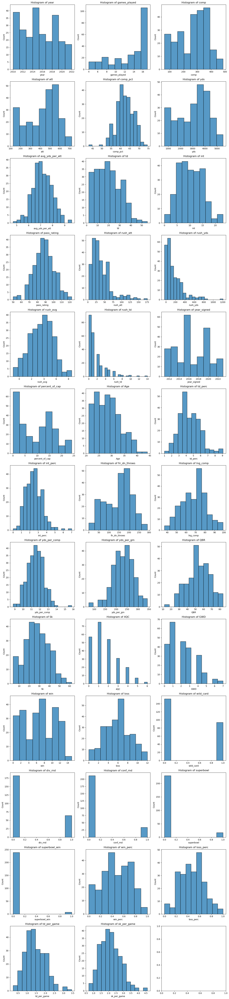

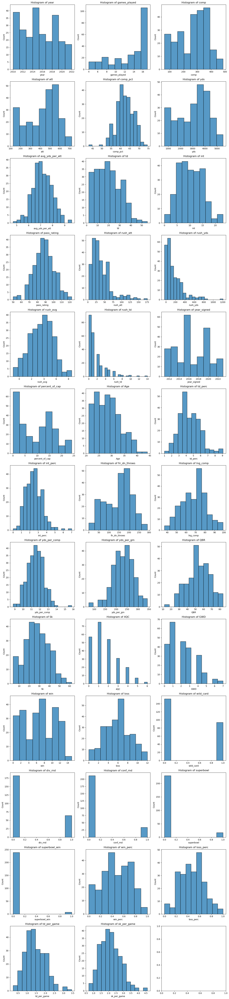

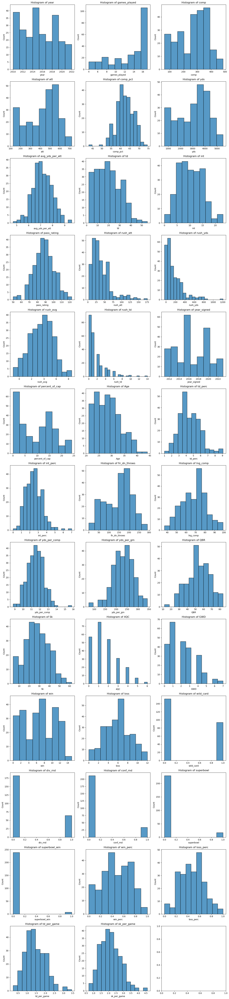

In [5]:
wrangle.new_visual_univariate_findings(train)

In [6]:
wrangle.univariate_findings()

,Feature,Distribution
0,games_played,left_skewed
1,comp,non-symmetric bimodal
2,att,non-symmetric bimodal
3,comp_pct,normally
4,yds,non-symmetric bimodal
5,avg_yds_per_att,normally
6,td,right-skewed
7,int,right-skewed
8,pass_rating,normally
9,rush_att,right-skewed


# Univariate Exploration Summary


# Bivariate Analysis

$H_0$: There is no correlation between our selected features and our target variable.

$H_\alpha$: There is a correlation between our selected features and our target variable.

$\alpha$: 0.05

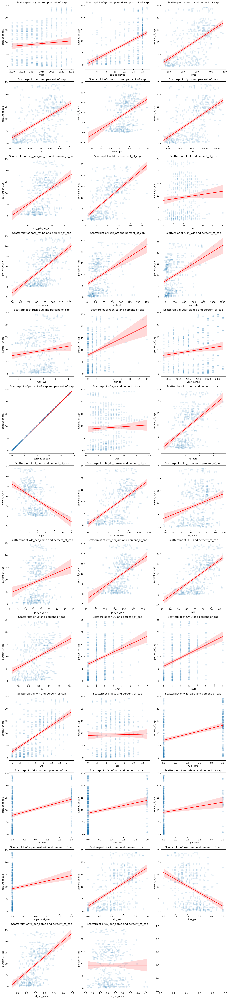

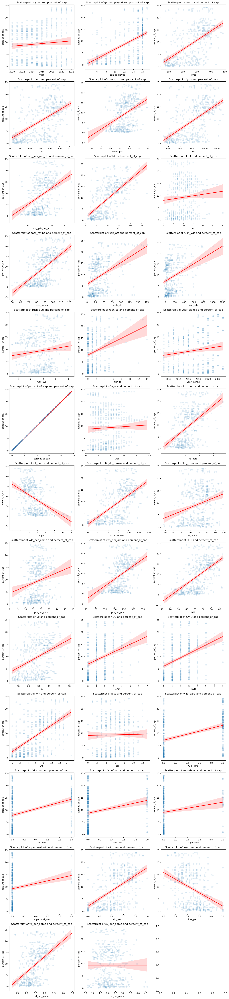

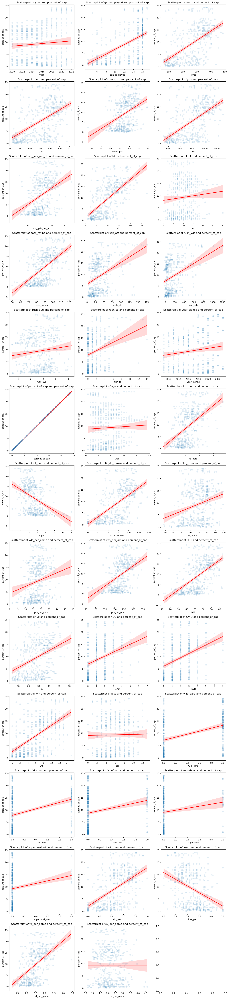

In [7]:
wrangle.new_visual_multivariate_findings(df, target)

# Bivariate Exploration Summary


In [8]:
wrangle.get_explore_data(columns_list, corr_test)

,Features,Correlation,Moving Forward
0,year,Negative,No
1,games_played,Positive,No
2,comp,Negative,No
3,att,Positive,No
4,comp_pct,Positive,No
5,yds,Positive,No
6,avg_yds_per_att,Positive,No
7,td,Positive,No
8,int,Positive,Yes
9,pass_rating,Positive,Yes


# Correlation Tests

> - We will use a confidence interval of 95%
> - the resulting alpha is .05

$H_0$: There is no statistical significance between our selected features and our target variable.

$H_\alpha$: There is a statistical significance between our selected features and our target variable.

$\alpha$: 0.05

In [9]:
corr_test.sort_values(by= 'p')

,feature,r,p,target
36,win,0.620792,1.323882e-27,percent_of_cap
35,td,0.601081,1.486490e-25,percent_of_cap
34,yds,0.574484,5.292411e-23,percent_of_cap
33,fir_dn_throws,0.563590,5.050176e-22,percent_of_cap
32,QBR,0.563277,5.381325e-22,percent_of_cap
31,comp,0.556350,2.160952e-21,percent_of_cap
30,games_played,0.554204,3.302561e-21,percent_of_cap
29,win_perc,0.550116,7.346897e-21,percent_of_cap
28,pass_rating,0.540268,4.823076e-20,percent_of_cap
27,att,0.525681,7.010624e-19,percent_of_cap


In [10]:
columns_list = corr_test.feature[corr_test.p < .05].to_list()

# Modeling

- We will use RMSE as our evaluation metric

** by using baseline as an evaluation metric we can be accurate to within 6.9 <br>
** 6.9 will be the baseline RMSE we will use for this project <br>
<br>
** I will be evaluating models developed using four different model types and various hyperparameter configurations * Models will be evaluated on train and validate data * The model that performs the best will then be evaluated on test data

## Features we are moving forward with

In [11]:
corr_test[corr_test.p < .05].sort_values(by='p').reset_index().drop(columns ='index')

,feature,r,p,target
0,win,0.620792,1.323882e-27,percent_of_cap
1,td,0.601081,1.486490e-25,percent_of_cap
2,yds,0.574484,5.292411e-23,percent_of_cap
3,fir_dn_throws,0.563590,5.050176e-22,percent_of_cap
4,QBR,0.563277,5.381325e-22,percent_of_cap
5,comp,0.556350,2.160952e-21,percent_of_cap
6,games_played,0.554204,3.302561e-21,percent_of_cap
7,win_perc,0.550116,7.346897e-21,percent_of_cap
8,pass_rating,0.540268,4.823076e-20,percent_of_cap
9,att,0.525681,7.010624e-19,percent_of_cap


In [12]:
# splitting the data in its respective catagory
X_train, X_validate, X_test, y_train, y_validate, y_test = wrangle.get_X_train_val_test(train,validate, test, columns_list,target)

In [13]:
# Scaling on selected features to be sent into model
X_train, X_validate, X_test = wrangle.scale_data(X_train, X_validate,X_test,cols = columns_list)

In [14]:
# Running the data through the models
df1, df2, df3,predict_linear, feature_weights  = wrangle.get_model_numbers(X_train, X_validate, X_test, y_train, y_validate, y_test)

In [15]:
train['predicted'] = predict_linear.tolist()

# Looking at predicted vs actual for a given year

In [16]:
pd.set_option('display.max_rows', None)
train[['predicted','percent_of_cap', 'year']].sort_values(by=['percent_of_cap','year'], ascending = False)

,predicted,percent_of_cap,year
name,,,
Aaron Rodgers,9.621794,24.1,2022
Aaron Rodgers,19.618208,24.1,2020
Aaron Rodgers,16.053070,24.1,2019
Josh Allen,19.822399,23.6,2021
Josh Allen,18.244566,23.6,2020
Josh Allen,12.567256,23.6,2019
Josh Allen,9.778426,23.6,2018
Russell Wilson,18.218717,23.5,2019
Lamar Jackson,18.995525,23.1,2022


## Train Data

In [17]:
# Models on the training data
df1

,model_train,rmse,r2
0,baseline,7.105761,0.000000
1,ordinary least squared(OLS),4.714900,0.559725
2,lasso lars(lars),6.552030,0.149781
3,Polynomial Regression(poly2),0.032821,0.999979
4,Generalized Linear Model (GLM),5.432543,0.415499
5,Random Forest Regressor,1.859801,0.931497


## Validate Data

In [18]:
# Models on the validate data
df2

,model_validate,rmse,r2
0,baseline,7.105761e+00,0.000000e+00
1,ordinary least squared(OLS),5.261772e+00,4.079147e-01
2,lasso lars(lars),6.701426e+00,3.959454e-02
3,Polynomial Regression(poly2),2.385521e+06,-1.216989e+11
4,Generalized Linear Model (GLM),5.457471e+00,3.630533e-01
5,Random Forest Regressor,4.860596e+00,4.947582e-01


## Test Data

In [19]:
# Model on the unseen test data
df3

,model_validate,rmse,r2
0,baseline,7.105761,0.000000
1,ordinary least squared(OLS),5.735874,0.434417


# Using fold method for splitting data

In [20]:
# Running the data through the models with the new train, test method.
master_df,best_parameters = wrangle.run_fold(df, columns_list, target)

In [21]:
master_df

,alpha,fit_intercept,verbose,score,model,n_jobs,link
2,1.0,False,True,5.858883,lars,NaN,NaN
3,1.0,False,False,5.858883,lars,NaN,NaN
6,2.0,False,True,6.514026,lars,NaN,NaN
7,2.0,False,False,6.514026,lars,NaN,NaN
0,1.0,True,True,6.726647,lars,NaN,NaN
1,1.0,True,False,6.726647,lars,NaN,NaN
76,20.0,True,True,7.127609,lars,NaN,NaN
32,9.0,True,True,7.127609,lars,NaN,NaN
33,9.0,True,False,7.127609,lars,NaN,NaN
36,10.0,True,True,7.127609,lars,NaN,NaN


In [22]:
# Running the test data through the models
best_parameters

,model_validate,rmse,r2
0,baseline,7.140633,0.00000
1,lasso lars(lars),6.258431,0.26245


# Modeling Summary
> - Our ordinary least squared(OLS) performed best with an RMSE score of 5.479861e+00 in validate
> - Our unseen test data beat baseline

# Conclusion

> - The different columns were distributed in differently see above for a chart

### Features that were statistically significant

In [23]:
corr_test[corr_test.p < .05].sort_values(by='p').reset_index().drop(columns ='index')

,feature,r,p,target
0,win,0.620792,1.323882e-27,percent_of_cap
1,td,0.601081,1.486490e-25,percent_of_cap
2,yds,0.574484,5.292411e-23,percent_of_cap
3,fir_dn_throws,0.563590,5.050176e-22,percent_of_cap
4,QBR,0.563277,5.381325e-22,percent_of_cap
5,comp,0.556350,2.160952e-21,percent_of_cap
6,games_played,0.554204,3.302561e-21,percent_of_cap
7,win_perc,0.550116,7.346897e-21,percent_of_cap
8,pass_rating,0.540268,4.823076e-20,percent_of_cap
9,att,0.525681,7.010624e-19,percent_of_cap


### NLP Insights

In [24]:
import w_wrangle as wran

In [25]:
# #Acquire and Prepare

# comm = wran.acquire_commentary()
# comm.player_commentary = comm.player_commentary.apply(wran.clean_strings)

# comm.head()

In [26]:
#Get grams to put into visualizations

# unigram_high_words, unigram_mid_words, unigram_low_words, bi_tri_high_words, bi_tri_mid_words, bi_tri_low_words = wran.get_grams(comm)

In [27]:
#Unigram visualizations

# wran.viz_unigrams(unigram_high_words, unigram_mid_words, unigram_low_words)

In [28]:
#Bigram visualizations

# wran.viz_bigrams(bi_tri_high_words, bi_tri_mid_words, bi_tri_low_words)

In [29]:
#Trigram visualizations

# wran.viz_trigrams(bi_tri_high_words, bi_tri_mid_words, bi_tri_low_words)

### Sentiment Analysis

In [30]:
#Get Sentiment Scores

# wran.get_sia_scores(comm)

### Key Findings

- 'Career' is not mentioned in low-percentage caps.
- High-percentage caps have a larger set of unique words. A lot of them could be comparisons to "the Greats" (Mahomes, Hurts, Wentz, Brady).
- Low-percentage caps talked a lot about backup (presumably quarterbacks), field, and run. Mention of "Jets" indicate historically low-percentage cap quarterbacks.
- The conversation always revolves around winning the Super Bowl across all three cap tiers.
- High-percentage caps talk about the Super Bowl and their performance in it significantly more. The focus of mid and low percentage caps also speak about their performance in the NFC.
- Sentiment scores are very high, if not maxed out, across all tiers. Only the low-percentage cap quarterbacks had a slightly lower score.

# Recommendations
> - Because our model was able to beat baseline we recommend using our model



# Next Steps
> - Run through the entire pipeline with more data scraped from different websites
> - Run throught the entire pipeline with different positons other than just quarterback

In [31]:
df

,team,year,games_played,comp,att,comp_pct,yds,avg_yds_per_att,td,int,...,loss,wild_card,div_rnd,conf_rnd,superbowl,superbowl_win,win_perc,loss_perc,td_per_game,sk_per_game
name,,,,,,,,,,,,,,,,,,,,,
Blaine Gabbert,JAX,2011,0.846154,0.348341,0.488294,0.250794,0.330392,0.142857,0.188679,11.0,...,10,0.0,0.0,0.0,0.0,0.0,0.27,0.67,0.177570,2.67
Blaine Gabbert,JAX,2012,0.461538,0.234597,0.262542,0.488889,0.217115,0.265306,0.132075,6.0,...,9,0.0,0.0,0.0,0.0,0.0,0.10,0.90,0.208723,2.20
Blaine Gabbert,SF,2015,0.307692,0.272512,0.269231,0.641270,0.292838,0.510204,0.150943,7.0,...,5,0.0,0.0,0.0,0.0,0.0,0.38,0.62,0.317757,3.12
Blaine Gabbert,SF,2016,0.153846,0.066351,0.065217,0.444444,0.065873,0.224490,0.056604,6.0,...,4,0.0,0.0,0.0,0.0,0.0,0.17,0.67,0.186916,1.83
Blaine Gabbert,ARI,2017,0.076923,0.075829,0.083612,0.403175,0.098912,0.346939,0.075472,6.0,...,3,0.0,0.0,0.0,0.0,0.0,0.40,0.60,0.302181,4.60
Michael Vick,PHI,2010,0.615385,0.402844,0.419732,0.625397,0.495383,0.693878,0.358491,6.0,...,3,1.0,0.0,0.0,0.0,0.0,0.67,0.25,0.473520,2.83
Michael Vick,PHI,2011,0.692308,0.450237,0.505017,0.536508,0.553868,0.632653,0.301887,14.0,...,6,0.0,0.0,0.0,0.0,0.0,0.54,0.46,0.358255,1.77
Michael Vick,PHI,2012,0.461538,0.334123,0.384615,0.482540,0.360763,0.408163,0.188679,10.0,...,7,0.0,0.0,0.0,0.0,0.0,0.30,0.70,0.302181,2.80
Michael Vick,PHI,2013,0.230769,0.033175,0.033445,0.371429,0.125385,0.795918,0.056604,3.0,...,4,1.0,0.0,0.0,0.0,0.0,0.29,0.57,0.149533,2.14


In [32]:
df.sort_values(by='percent_of_cap', ascending=False)

,team,year,games_played,comp,att,comp_pct,yds,avg_yds_per_att,td,int,...,loss,wild_card,div_rnd,conf_rnd,superbowl,superbowl_win,win_perc,loss_perc,td_per_game,sk_per_game
name,,,,,,,,,,,,,,,,,,,,,
Aaron Rodgers,GB,2022,1.000000,0.680095,0.704013,0.688889,0.634312,0.428571,0.452830,12.0,...,9,0.0,0.0,0.0,0.0,0.0,0.47,0.53,0.404984,1.88
Aaron Rodgers,GB,2021,0.923077,0.718009,0.685619,0.825397,0.720501,0.612245,0.660377,4.0,...,3,1.0,1.0,0.0,0.0,0.0,0.81,0.19,0.647975,1.88
Aaron Rodgers,GB,2020,0.923077,0.732227,0.677258,0.882540,0.758260,0.714286,0.867925,5.0,...,3,1.0,1.0,1.0,0.0,0.0,0.81,0.19,0.862928,1.25
Aaron Rodgers,GB,2018,0.923077,0.732227,0.795987,0.615873,0.787605,0.551020,0.433962,2.0,...,9,0.0,0.0,0.0,0.0,0.0,0.38,0.56,0.414330,3.06
Aaron Rodgers,GB,2019,0.923077,0.687204,0.749164,0.606349,0.697312,0.469388,0.452830,4.0,...,3,1.0,1.0,1.0,0.0,0.0,0.81,0.19,0.433022,2.25
Josh Allen,BUF,2018,0.615385,0.251185,0.332776,0.314286,0.301662,0.367347,0.150943,12.0,...,6,0.0,0.0,0.0,0.0,0.0,0.42,0.50,0.186916,2.33
Josh Allen,BUF,2020,0.923077,0.789100,0.754181,0.834921,0.808537,0.653061,0.660377,10.0,...,3,1.0,1.0,1.0,0.0,0.0,0.81,0.19,0.647975,1.62
Josh Allen,BUF,2021,1.000000,0.819905,0.877926,0.647619,0.780423,0.428571,0.641509,15.0,...,6,1.0,1.0,0.0,0.0,0.0,0.65,0.35,0.588785,1.53
Josh Allen,BUF,2019,0.923077,0.492891,0.568562,0.504762,0.509953,0.408163,0.339623,9.0,...,6,1.0,0.0,0.0,0.0,0.0,0.62,0.38,0.317757,2.38


In [33]:
df[['percent_of_cap', 'year', 'td']][df.index == 'Tom Brady']

,percent_of_cap,year,td
name,,,
Tom Brady,9.3,2010,0.641509
Tom Brady,9.3,2011,0.698113
Tom Brady,9.3,2012,0.603774
Tom Brady,13.2,2013,0.433962
Tom Brady,13.2,2014,0.584906
Tom Brady,13.2,2015,0.641509
Tom Brady,12.2,2016,0.490566
Tom Brady,12.2,2017,0.566038
Tom Brady,12.2,2018,0.509434


In [34]:
df.superbowl_win.groupby(df.index).sum().sort_values(ascending = False)

name
Tom Brady             4.0
Eli Manning           1.0
Joe Flacco            1.0
Patrick Mahomes       1.0
Peyton Manning        1.0
Carson Wentz          1.0
Brock Osweiler        1.0
Russell Wilson        1.0
Matt Barkley          0.0
Matt Moore            0.0
Matt Hasselbeck       0.0
Matt Flynn            0.0
Matt Cassel           0.0
Aaron Rodgers         0.0
Matt Schaub           0.0
Mark Sanchez          0.0
Marcus Mariota        0.0
Lamar Jackson         0.0
Kyle Orton            0.0
Kirk Cousins          0.0
Kevin Kolb            0.0
Josh McCown           0.0
Josh Freeman          0.0
Matt Ryan             0.0
Nick Foles            0.0
Michael Vick          0.0
Sam Bradford          0.0
Trevor Siemian        0.0
Tony Romo             0.0
Teddy Bridgewater     0.0
Taylor Heinicke       0.0
Shaun Hill            0.0
Sam Darnold           0.0
Ryan Tannehill        0.0
Mike Glennon          0.0
Ryan Mallett          0.0
Ryan Fitzpatrick      0.0
Rex Grossman          0.0
Philip 

In [35]:
feature_weights

array([ 3.45122317e+00, -2.56693344e+01, -4.29564369e+00, -6.75557128e-03,
       -4.67445545e+00,  1.97713151e+00,  1.53618686e+01,  4.25525686e+00,
        2.90226535e+00, -1.25591856e+01, -3.27647971e+01,  1.96873297e+01,
        2.32043345e+01, -3.61203708e+00,  2.30000799e-01, -1.63241043e+00,
        2.99023108e+00,  1.47885157e+01, -1.63267865e+01, -6.50675856e+01,
       -2.03251523e+01,  8.82074999e+00,  1.28435112e+01,  6.12499430e+01,
        6.10353707e+00,  1.03602951e+00,  4.26993110e-01,  1.14904852e+01,
       -1.17245164e+01])

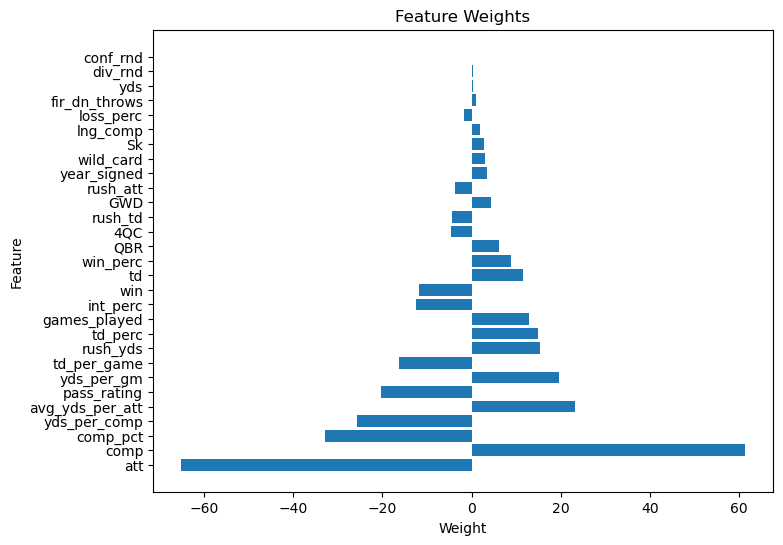

In [36]:
feature_names = X_train.columns  # Assuming X_train is a pandas DataFrame


# Sort feature names and weights based on absolute weights
sorted_indices = sorted(range(len(feature_weights)), key=lambda k: abs(feature_weights[k]), reverse=True)
sorted_feature_names = [feature_names[i] for i in sorted_indices]
sorted_feature_weights = [feature_weights[i] for i in sorted_indices]

plt.figure(figsize=(8, 6))
plt.barh(sorted_feature_names, sorted_feature_weights)
plt.xlabel('Weight')
plt.ylabel('Feature')
plt.title('Feature Weights')
plt.show()

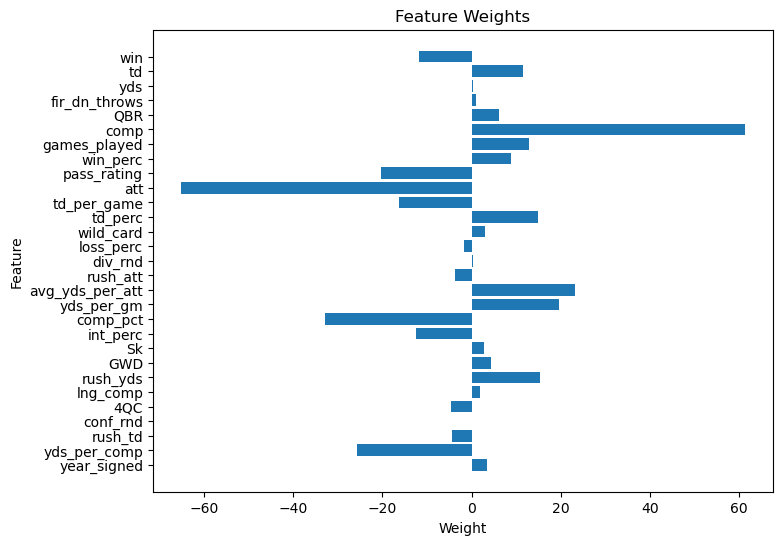

In [37]:
feature_names = X_train.columns  # Assuming X_train is a pandas DataFrame

plt.figure(figsize=(8, 6))
plt.barh(feature_names, feature_weights)
plt.xlabel('Weight')
plt.ylabel('Feature')
plt.title('Feature Weights')
plt.show()

In [38]:
train.select_dtypes(exclude='object').columns

Index(['year', 'games_played', 'comp', 'att', 'comp_pct', 'yds',
       'avg_yds_per_att', 'td', 'int', 'pass_rating', 'rush_att', 'rush_yds',
       'rush_avg', 'rush_td', 'year_signed', 'percent_of_cap', 'Age',
       'td_perc', 'int_perc', 'fir_dn_throws', 'lng_comp', 'yds_per_comp',
       'yds_per_gm', 'QBR', 'Sk', '4QC', 'GWD', 'win', 'loss', 'wild_card',
       'div_rnd', 'conf_rnd', 'superbowl', 'superbowl_win', 'win_perc',
       'loss_perc', 'td_per_game', 'sk_per_game', 'predicted'],
      dtype='object')

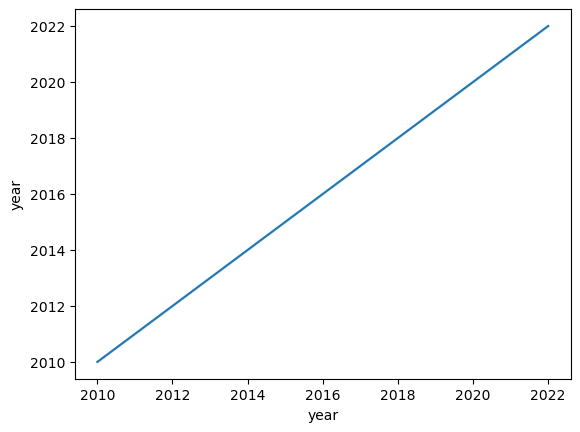

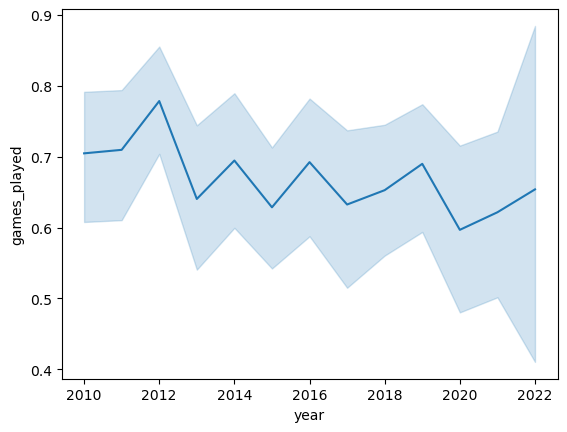

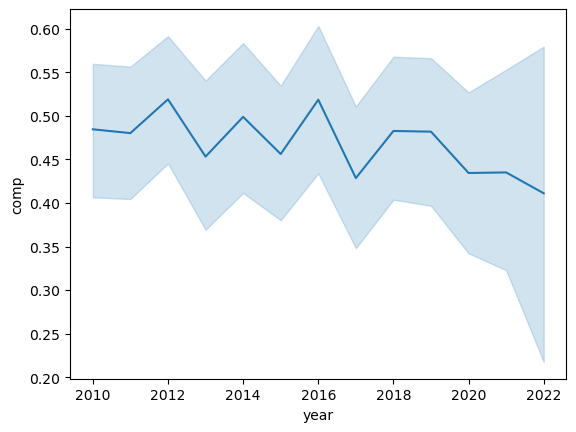

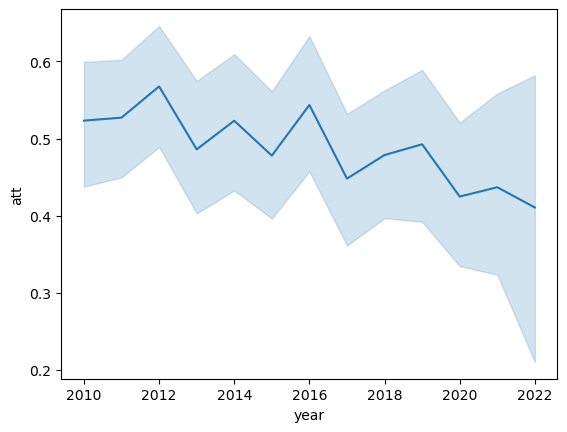

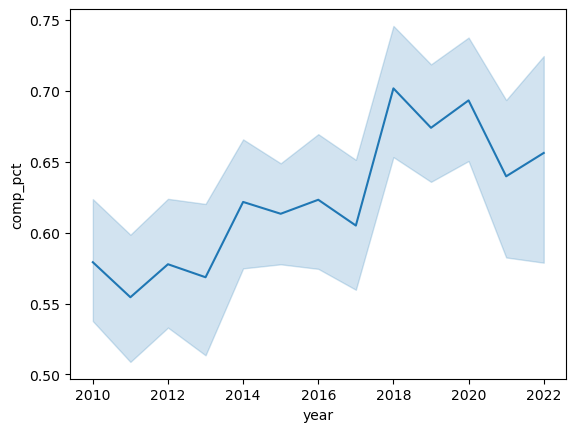

...

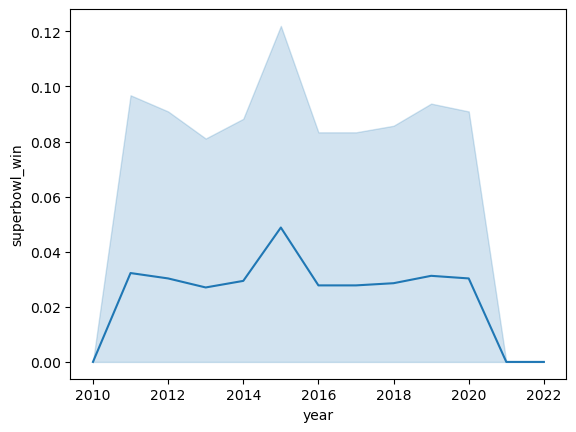

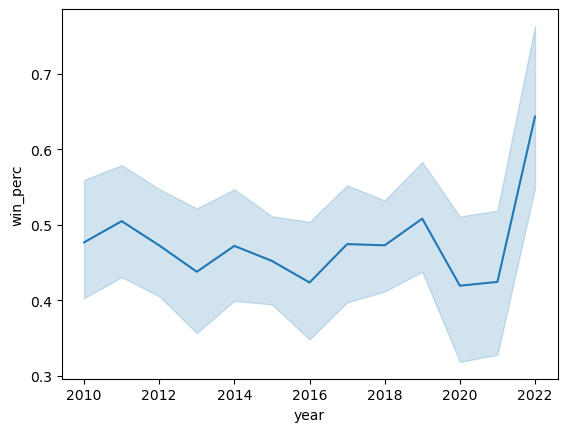

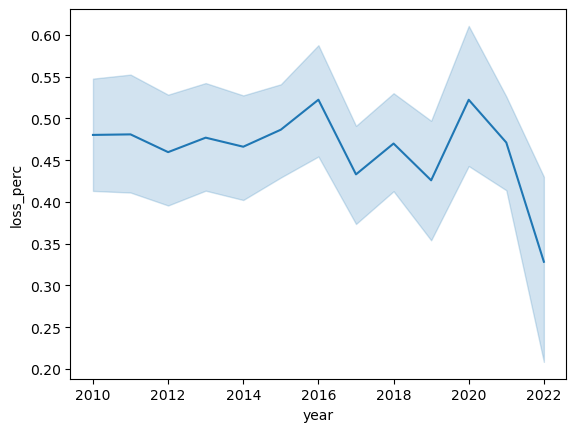

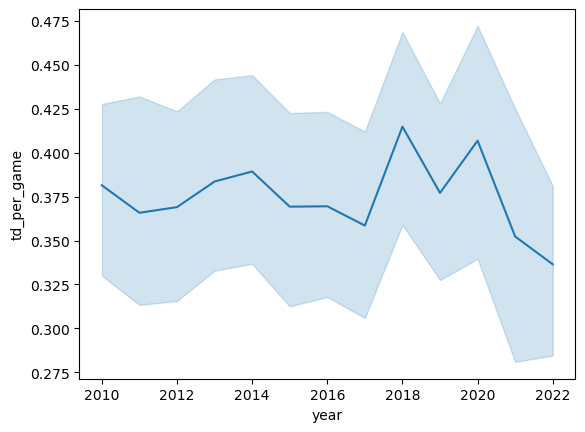

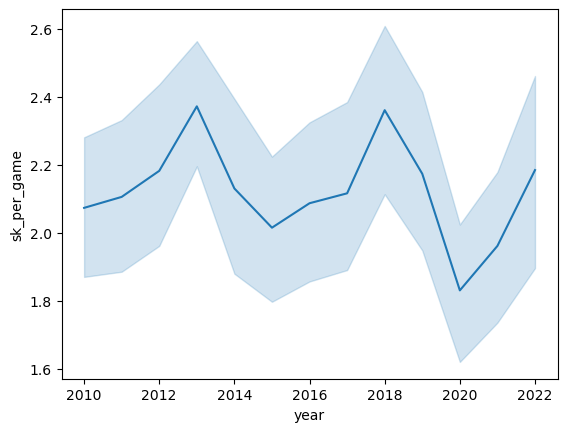

ValueError: Could not interpret value `predicted` for parameter `y`

In [39]:
for x in train.select_dtypes(exclude='object').columns:
    sns.lineplot(data = df, x = 'year', y = x)
    plt.show()

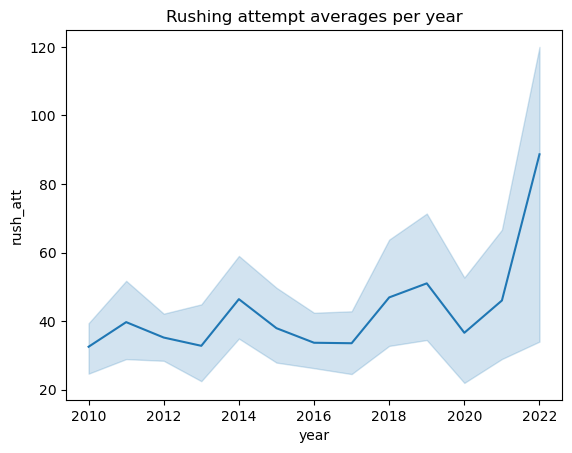

In [40]:
sns.lineplot(data = train, x = 'year', y = 'rush_att' )
plt.title('Rushing attempt averages per year')
plt.show()

In [41]:
pd.set_option('display.max_columns', None)

In [42]:
df

,team,year,games_played,comp,att,comp_pct,yds,avg_yds_per_att,td,int,pass_rating,rush_att,rush_yds,rush_avg,rush_td,full_name,year_signed,percent_of_cap,Player,Age,td_perc,int_perc,fir_dn_throws,lng_comp,yds_per_comp,yds_per_gm,QBR,Sk,4QC,GWD,win,loss,wild_card,div_rnd,conf_rnd,superbowl,superbowl_win,win_perc,loss_perc,td_per_game,sk_per_game
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Blaine Gabbert,JAX,2011,0.846154,0.348341,0.488294,0.250794,0.330392,0.142857,0.188679,11.0,0.215012,0.260116,0.104285,2.0,0.000000,Blaine Gabbert,0.000000,1.4,Blaine Gabbert,22,0.228916,0.385714,0.381443,0.647887,0.293333,0.280566,0.143255,0.620690,0.000000,0.000000,0.266667,10,0.0,0.0,0.0,0.0,0.0,0.27,0.67,0.177570,2.67
Blaine Gabbert,JAX,2012,0.461538,0.234597,0.262542,0.488889,0.217115,0.265306,0.132075,6.0,0.379571,0.086705,0.070331,3.1,0.000000,Blaine Gabbert,0.333333,1.4,Blaine Gabbert,23,0.265060,0.314286,0.247423,0.732394,0.266667,0.340412,0.336579,0.310345,0.142857,0.142857,0.066667,9,0.0,0.0,0.0,0.0,0.0,0.10,0.90,0.208723,2.20
Blaine Gabbert,SF,2015,0.307692,0.272512,0.269231,0.641270,0.292838,0.510204,0.150943,7.0,0.500825,0.167630,0.174616,5.8,0.071429,Blaine Gabbert,0.333333,0.5,Blaine Gabbert,26,0.301205,0.357143,0.292096,0.605634,0.413333,0.622587,0.357441,0.362069,0.285714,0.285714,0.200000,5,0.0,0.0,0.0,0.0,0.0,0.38,0.62,0.317757,3.12
Blaine Gabbert,SF,2016,0.153846,0.066351,0.065217,0.444444,0.065873,0.224490,0.056604,6.0,0.255980,0.213873,0.164915,4.3,0.142857,Blaine Gabbert,0.500000,0.5,Blaine Gabbert,27,0.253012,0.542857,0.171821,0.661972,0.253333,0.301802,0.586926,0.120690,0.000000,0.000000,0.066667,4,0.0,0.0,0.0,0.0,0.0,0.17,0.67,0.186916,1.83
Blaine Gabbert,ARI,2017,0.076923,0.075829,0.083612,0.403175,0.098912,0.346939,0.075472,6.0,0.304922,0.109827,0.091350,3.7,0.000000,Blaine Gabbert,0.500000,0.5,Blaine Gabbert,28,0.301205,0.500000,0.189003,0.338028,0.413333,0.504505,0.307371,0.327586,0.285714,0.285714,0.133333,3,0.0,0.0,0.0,0.0,0.0,0.40,0.60,0.302181,4.60
Michael Vick,PHI,2010,0.615385,0.402844,0.419732,0.625397,0.495383,0.693878,0.358491,6.0,0.693429,0.560694,0.571544,6.8,0.642857,Michael Vick,0.000000,13.3,Michael Vick,30,0.554217,0.228571,0.408935,0.887324,0.626667,0.614865,0.738526,0.517241,0.571429,0.428571,0.533333,3,1.0,0.0,0.0,0.0,0.0,0.67,0.25,0.473520,2.83
Michael Vick,PHI,2011,0.692308,0.450237,0.505017,0.536508,0.553868,0.632653,0.301887,14.0,0.482816,0.410405,0.502021,8.0,0.071429,Michael Vick,0.000000,6.1,Michael Vick,31,0.397590,0.471429,0.529210,0.633803,0.640000,0.623230,0.681502,0.327586,0.000000,0.000000,0.466667,6,0.0,0.0,0.0,0.0,0.0,0.54,0.46,0.358255,1.77
Michael Vick,PHI,2012,0.461538,0.334123,0.384615,0.482540,0.360763,0.408163,0.188679,10.0,0.389607,0.341040,0.293452,5.4,0.071429,Michael Vick,0.166667,6.1,Michael Vick,32,0.289157,0.400000,0.395189,0.690141,0.440000,0.565637,0.488178,0.413793,0.428571,0.428571,0.200000,7,0.0,0.0,0.0,0.0,0.0,0.30,0.70,0.302181,2.80
Michael Vick,PHI,2013,0.230769,0.033175,0.033445,0.371429,0.125385,0.795918,0.056604,3.0,0.504674,0.190751,0.272433,8.5,0.142857,Michael Vick,0.166667,3.0,Michael Vick,33,0.301205,0.300000,0.178694,0.591549,1.000000,0.364221,0.578581,0.189655,0.000000,0.000000,0.133333,4,1.0,0.0,0.0,0.0,0.0,0.29,0.57,0.149533,2.14


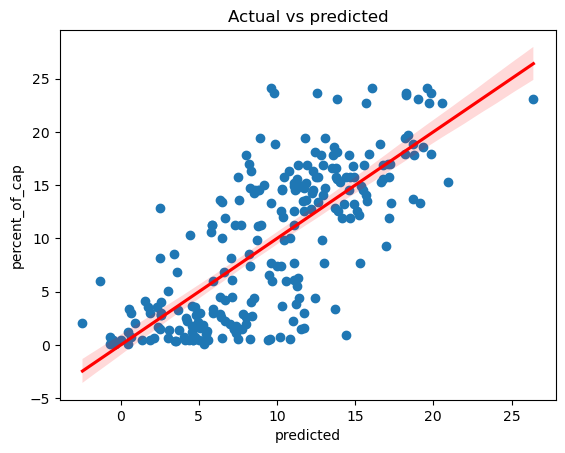

In [43]:
sns.regplot(data = train, x = 'predicted', y = target, scatter_kws={'alpha': 1}, line_kws={'color': 'red'})
plt.title('Actual vs predicted')
plt.show()

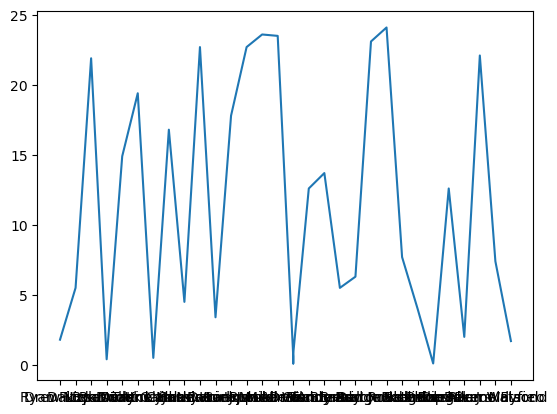

In [44]:
plt.plot(df.percent_of_cap[df.year == 2020])

In [45]:
feature_names = X_train.columns
weights_df = pd.DataFrame({'Feature': feature_names, 'Weight': feature_weights})

weights_df.sort_values(by='Weight', ascending = False)

,Feature,Weight
23,comp,61.249943
12,avg_yds_per_att,23.204334
11,yds_per_gm,19.687330
6,rush_yds,15.361869
17,td_perc,14.788516
22,games_played,12.843511
27,td,11.490485
21,win_perc,8.820750
24,QBR,6.103537
7,GWD,4.255257


In [46]:
the_data = train.reset_index()

In [62]:

answer = the_data[['name','predicted','percent_of_cap', 'year']][(the_data.name == 'Aaron Rodgers') | (the_data.name == 'Tom Brady') | (the_data.name == 'Josh Allen')].sort_values(by=['name','percent_of_cap','year'], ascending = False)

In [48]:
answer[answer.name == 'Aaron Rodgers']

,name,predicted,percent_of_cap,year
53,Aaron Rodgers,9.621794,24.1,2022
112,Aaron Rodgers,19.618208,24.1,2020
202,Aaron Rodgers,16.053070,24.1,2019
204,Aaron Rodgers,16.609912,18.9,2015
129,Aaron Rodgers,18.720402,18.9,2014
169,Aaron Rodgers,9.865312,18.9,2013
2,Aaron Rodgers,18.204765,17.9,2012
149,Aaron Rodgers,19.869370,17.9,2011
179,Aaron Rodgers,15.870579,17.9,2010


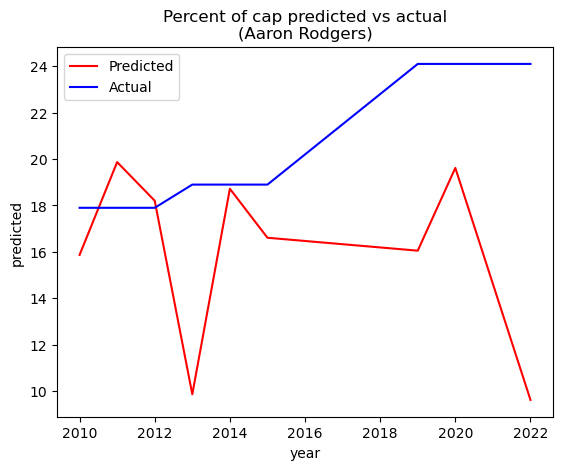

In [49]:
sns.lineplot(data = answer[answer.name == 'Aaron Rodgers'], x = 'year', y = 'predicted', ci=None,color='red',label='Predicted')
sns.lineplot(data = answer[answer.name == 'Aaron Rodgers'], x = 'year', y = 'percent_of_cap',ci=None,color='blue',label='Actual')
plt.title('Percent of cap predicted vs actual\n(Aaron Rodgers)')
plt.show()

In [50]:
answer[answer.name == 'Tom Brady']

,name,predicted,percent_of_cap,year
186,Tom Brady,18.682584,13.7,2021
25,Tom Brady,14.929116,13.2,2015
144,Tom Brady,14.262692,13.2,2014
177,Tom Brady,15.255609,12.2,2016
120,Tom Brady,16.976410,9.3,2011


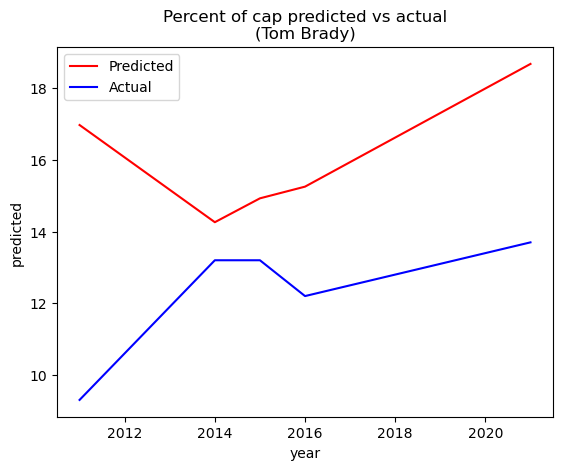

In [51]:
sns.lineplot(data = answer[answer.name == 'Tom Brady'], x = 'year', y = 'predicted', ci=None,color='red',label='Predicted')
sns.lineplot(data = answer[answer.name == 'Tom Brady'], x = 'year', y = 'percent_of_cap',ci=None,color='blue',label='Actual')
plt.title('Percent of cap predicted vs actual\n(Tom Brady)')
plt.show()

In [52]:
answer.year[answer.name == 'Josh Allen']

59     2021
164    2020
117    2019
115    2018
Name: year, dtype: int64

In [53]:
# answer.year = answer.year[answer.name == 'Josh Allen'].astype('int')

In [54]:
# df['year'] = pd.to_numeric(df['year'])

In [55]:
answer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 186 to 179
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            18 non-null     object 
 1   predicted       18 non-null     float64
 2   percent_of_cap  18 non-null     float64
 3   year            4 non-null      float64
dtypes: float64(3), object(1)
memory usage: 720.0+ bytes


In [61]:
answer[answer.name == 'Josh Allen']

,name,predicted,percent_of_cap,year
59,Josh Allen,19.822399,23.6,2021.0
164,Josh Allen,18.244566,23.6,2020.0
117,Josh Allen,12.567256,23.6,2019.0
115,Josh Allen,9.778426,23.6,2018.0


In [73]:
answer

,name,predicted,percent_of_cap,year
186,Tom Brady,18.682584,13.7,2021
25,Tom Brady,14.929116,13.2,2015
144,Tom Brady,14.262692,13.2,2014
177,Tom Brady,15.255609,12.2,2016
120,Tom Brady,16.976410,9.3,2011
59,Josh Allen,19.822399,23.6,2021
164,Josh Allen,18.244566,23.6,2020
117,Josh Allen,12.567256,23.6,2019
115,Josh Allen,9.778426,23.6,2018
53,Aaron Rodgers,9.621794,24.1,2022


In [70]:
answer.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 186 to 179
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            18 non-null     object 
 1   predicted       18 non-null     float64
 2   percent_of_cap  18 non-null     float64
 3   year            18 non-null     int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 720.0+ bytes


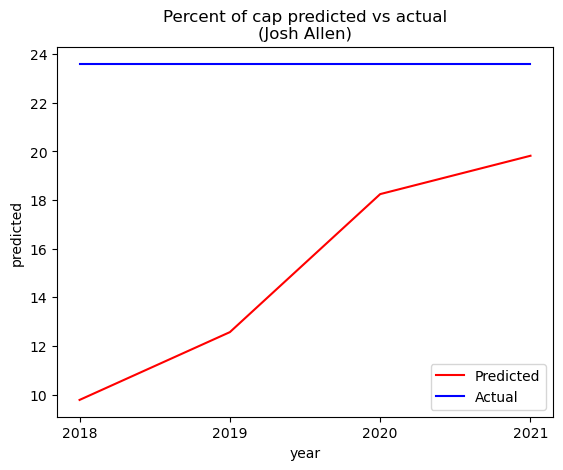

In [77]:
sns.lineplot(data = answer[answer.name == 'Josh Allen'], x = 'year', y = 'predicted', ci=None,color='red',label='Predicted')
sns.lineplot(data = answer[answer.name == 'Josh Allen'], x = 'year', y = 'percent_of_cap',ci=None,color='blue',label='Actual')
plt.xticks([2018, 2019, 2020, 2021])
plt.title('Percent of cap predicted vs actual\n(Josh Allen)')
plt.show()

In [64]:
def change_year(x):
    return int(x)

In [66]:
answer.year = answer.year.apply(change_year)

In [85]:
working_with = train.reset_index()

In [87]:
working_with

,name,team,year,games_played,comp,att,comp_pct,yds,avg_yds_per_att,td,int,pass_rating,rush_att,rush_yds,rush_avg,rush_td,full_name,year_signed,percent_of_cap,Player,Age,td_perc,int_perc,fir_dn_throws,lng_comp,yds_per_comp,yds_per_gm,QBR,Sk,4QC,GWD,win,loss,wild_card,div_rnd,conf_rnd,superbowl,superbowl_win,win_perc,loss_perc,td_per_game,sk_per_game,predicted
0,Blake Bortles,JAX,2014,14.0,280.0,475.0,58.9,2907.0,6.1,11.0,17.0,69.51,56.0,419.0,7.5,0.0,Blake Bortles,2014,9.9,Blake Bortles,22,2.3,3.6,136,63,10.4,207.7,28.000000,55,1.0,1.0,3,10,0.0,0.0,0.0,0.0,0.0,0.21,0.71,0.79,3.93,8.702922
1,Chad Henne,JAX,2013,15.0,305.0,503.0,60.6,3241.0,6.4,13.0,14.0,76.48,27.0,77.0,2.9,0.0,Chad Henne,2014,3.0,Chad Henne,28,2.6,2.8,152,62,10.6,216.1,34.900000,38,1.0,1.0,4,9,0.0,0.0,0.0,0.0,0.0,0.27,0.60,0.87,2.53,5.927772
2,Aaron Rodgers,GB,2012,16.0,371.0,552.0,67.2,4295.0,7.8,39.0,8.0,108.02,54.0,259.0,4.8,2.0,Aaron Rodgers,2013,17.9,Aaron Rodgers,29,7.1,1.4,215,73,11.6,268.4,71.200000,51,2.0,3.0,11,5,1.0,1.0,0.0,0.0,0.0,0.69,0.31,2.44,3.19,18.204765
3,Jameis Winston,TB,2017,13.0,282.0,442.0,63.8,3504.0,7.9,19.0,11.0,92.24,33.0,135.0,4.1,1.0,Jameis Winston,2020,0.6,Jameis Winston,23,4.3,2.5,185,70,12.4,269.5,52.000000,33,2.0,2.0,3,10,0.0,0.0,0.0,0.0,0.0,0.23,0.77,1.46,2.54,9.533921
4,Trevor Siemian,DEN,2016,14.0,289.0,486.0,59.5,3401.0,7.0,18.0,10.0,84.57,28.0,57.0,2.0,0.0,Trevor Siemian,2019,1.1,Trevor Siemian,25,3.7,2.1,155,76,11.8,242.9,49.700000,31,3.0,2.0,8,6,0.0,0.0,0.0,0.0,0.0,0.57,0.43,1.29,2.21,7.384098
5,Jay Cutler,CHI,2011,10.0,182.0,314.0,58.0,2319.0,7.4,13.0,7.0,85.67,18.0,56.0,3.1,1.0,Jay Cutler,2014,13.6,Jay Cutler,28,4.1,2.2,107,56,12.7,231.9,60.500000,23,1.0,1.0,7,3,0.0,0.0,0.0,0.0,0.0,0.70,0.30,1.30,2.30,6.349205
6,Matt Ryan,ATL,2012,16.0,422.0,615.0,68.6,4719.0,7.7,32.0,14.0,99.10,34.0,141.0,4.1,1.0,Matt Ryan,2013,16.9,Matt Ryan,27,5.2,2.3,248,80,11.2,294.9,71.600000,28,4.0,6.0,13,3,1.0,1.0,1.0,0.0,0.0,0.81,0.19,2.00,1.75,16.795016
7,Geno Smith,NYJ,2013,16.0,247.0,443.0,55.8,3046.0,6.9,12.0,21.0,66.47,72.0,366.0,5.1,6.0,Geno Smith,2013,0.7,Geno Smith,23,2.7,4.7,148,69,12.3,190.4,41.000000,43,2.0,5.0,8,8,0.0,0.0,0.0,0.0,0.0,0.50,0.50,0.75,2.69,6.465608
8,Tony Romo,DAL,2011,16.0,346.0,522.0,66.3,4184.0,8.0,31.0,10.0,102.53,22.0,46.0,2.1,1.0,Tony Romo,2013,14.6,Tony Romo,31,5.9,1.9,203,77,12.1,261.5,69.000000,36,4.0,4.0,8,8,0.0,0.0,0.0,0.0,0.0,0.50,0.50,1.94,2.25,10.314240
9,Trevor Siemian,NO,2021,6.0,108.0,188.0,57.4,1154.0,6.1,11.0,3.0,88.39,9.0,20.0,2.2,1.0,Trevor Siemian,2021,0.5,Trevor Siemian,30,5.9,1.6,61,46,10.7,192.3,35.500000,9,1.0,1.0,0,4,0.0,0.0,0.0,0.0,0.0,0.00,0.67,1.83,1.50,1.854517


<Axes: ylabel='percent_of_cap'>

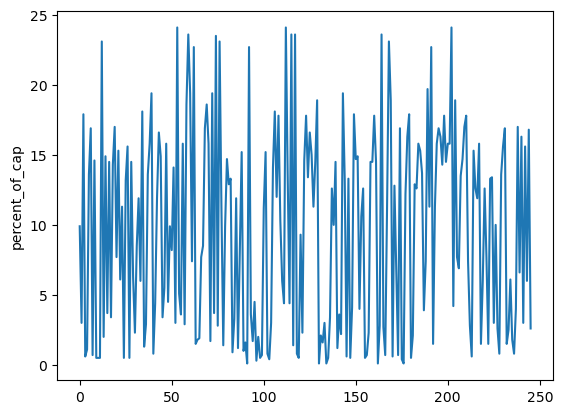

In [89]:
sns.lineplot(data=working_with, x=working_with.index, y='percent_of_cap')

<Axes: ylabel='percent_of_cap'>

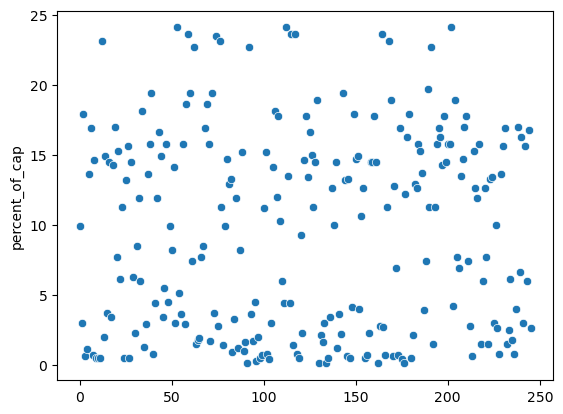

In [90]:
sns.scatterplot(data=working_with, x=working_with.index, y='percent_of_cap')

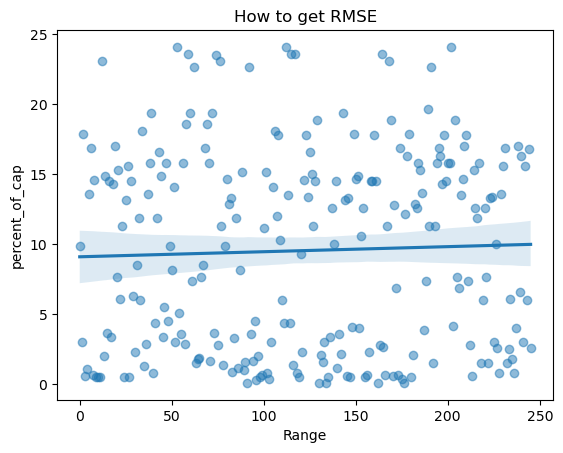

In [97]:
sns.regplot(data=working_with, x=working_with.index, y='percent_of_cap', scatter_kws={'alpha': 0.5})
plt.title('How to get RMSE')
plt.xlabel('Range')
plt.show()